In [1]:
# load libraries

# Pkg.add("Plots")
using Plots
using Random

# set random seed
Random.seed!(1234);

In [2]:
#Function that Simulates Roullet according to the French rules. In this game the player only plays colours. 
#The only two actions are therefore to play red, or to play black. The house wins if the result is 0 or below 19. 
#The player wins if the result is 19 or above. Hence, there is a clear 0rpobabilistic advantage for the house in Roulette. 


function playRoullete()
    #Simulation of a Game of Roulette. All numbers between 0 and 36 are drawn with equal probability.
    roll = rand(0:36)
   
    #if the player wins the function returns treu, if the player looses false is returned.
    if roll == 0
        return false
    elseif roll > 18
        return true
    else 
        return false
    end
end

playRoullete (generic function with 1 method)

In [3]:
#This functions Simulates a player. The funds variable defines how much money the player has. 
#The initialBet variable defines how much the player bets per round played. The numberBets variable defines the 
#number of games played.

function betting(funds, bet, numberBets)
    
    #Stores the games number from first to last game played
    xValues = []
    #Stores the remaining funds after each game played
    yValues = []
    
    #used to keep track on the number of games played
    betCounter = 1
    
    while betCounter <= numberBets
        #increases the players funds if he wins
        if playRoullete()
            funds += bet
        #decreases the players funds if he looses
        else 
            funds -= bet   
        end
        
        #Takes the updated funds / iteration number and pushes them to the prepared empty lists
        push!(xValues, betCounter)
        push!(yValues, funds)
        
        betCounter += 1
    end
    
    #returns the time series of the development of the funds 
    return xValues,yValues
    
end

betting (generic function with 1 method)

In [4]:
#parameters of the simulation

numberPlayers = 100 #the number of simulated players
funds = 10000 #the simulated amount of cash each player holds
bet = 100 #the cost of a lost bet and the win of a won bet
numberBets = 100 # the number of bets placed per player

#This function takes the above defined parameters, invokes the betting function to simulate the games
#and then plots the results.
function createPlots(numberPlayers, funds, bet, numberBets)
    
    #Invoke betting function and create the initial plot
    xValues, yValues  = betting(funds, bet, numberBets)
    plot(xValues, yValues)
    
    #Invoke betting function (numberPlayers-1) times and add the results to the craeted plot
    for i in 1:(numberPlayers-1)
        xValues, yValues  = betting(funds, bet, numberBets)
        plot!(xValues, yValues)
    end
    
    #display the created plot
    display(plot!())
end


createPlots (generic function with 1 method)

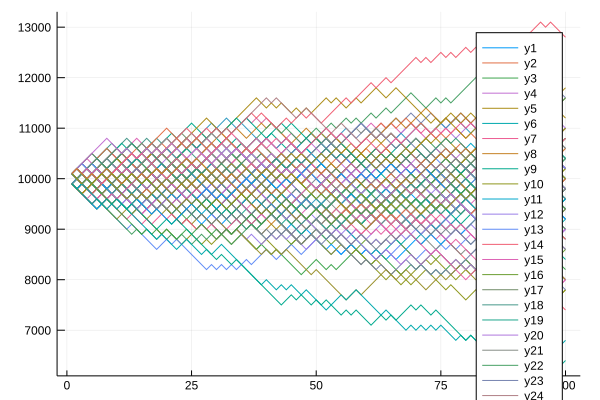

In [5]:
# Here we simulate 100 players, playing 100 rounds of roulette each, betting 100$ per round with the option to win 100$. 
# After 100 rounds there is no clear tendency visible. The winners and loosers seem rather equally distributed.
createPlots(numberPlayers, funds, bet, numberBets)

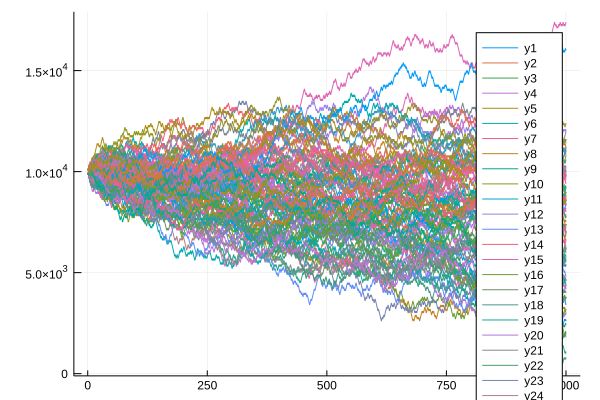

In [6]:
# Here we simulate 100 players, playing 1000 rounds of roulette each, betting 100$ per round with the option to win 100$. 
# After 1000 rounds there is a weak downwards tendency visible. There are still clear winners among the players, however, 
# the number of loosers is definately larger.
createPlots(numberPlayers, funds, bet, 1000)

In [7]:
# Here we simulate 100 players, playing 10000 rounds of roulette each, betting 100$ per round with the option to win 100$. 
# After 10000 rounds there is a strong downwards tendency visible. Only few players remain a positive balance. The wast 
# majority has lost money and many would have gone heavily indebted.
createPlots(numberPlayers, funds, bet, 10000)